**Importing Libraries and Data**

In [1]:
pip install torch==1.7.0

  Using cached https://files.pythonhosted.org/packages/24/44/2b66a46b8ce7895a96db1a6dc525d9a9910353f7ca323bf04d0753603f18/torch-1.7.0-cp37-cp37m-win_amd64.whl
Note: you may need to restart the kernel to use updated packages.


Exception:
Traceback (most recent call last):
  File "C:\Anaconda\lib\site-packages\pip\_internal\cli\base_command.py", line 179, in main
    status = self.run(options, args)
  File "C:\Anaconda\lib\site-packages\pip\_internal\commands\install.py", line 315, in run
    resolver.resolve(requirement_set)
  File "C:\Anaconda\lib\site-packages\pip\_internal\resolve.py", line 131, in resolve
    self._resolve_one(requirement_set, req)
  File "C:\Anaconda\lib\site-packages\pip\_internal\resolve.py", line 297, in _resolve_one
    dist = abstract_dist.dist()
  File "C:\Anaconda\lib\site-packages\pip\_internal\operations\prepare.py", line 90, in dist
    self.req.source_dir))[0]
IndexError: list index out of range


In [2]:
pip install chart_studio

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install seaborn==0.11.1

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install scikit-learn==0.24.1

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install plotly==4.14.3

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install pandas==1.1.5

Note: you may need to restart the kernel to use updated packages.


In [7]:
pip install numpy==1.19.5 

Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install matplotlib==3.3.3


Note: you may need to restart the kernel to use updated packages.


In [9]:
pip install cufflinks==0.17.3

Note: you may need to restart the kernel to use updated packages.


In [10]:
pip install tqdm==4.55.1

Note: you may need to restart the kernel to use updated packages.


In [11]:
pip install skorch

Note: you may need to restart the kernel to use updated packages.


In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style = 'whitegrid')
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from tqdm.notebook import tqdm
import plotly.express as px

from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix,classification_report

import collections
from sklearn.preprocessing import MinMaxScaler, LabelEncoder    
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import torch.nn.functional as F

from skorch import NeuralNetClassifier
from skorch.callbacks import Callback

from plotly import __version__ 
import cufflinks as cf 
  
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 

import time
  
# to get the connection 
init_notebook_mode(connected = True) 
%matplotlib inline
# plotly also serves online, 
# but we are using just a sample 
cf.go_offline

<function cufflinks.offline.go_offline(connected=None)>

First, let´s read the dataset and its dictionary. Please note this dataset is provided from Kaggle, from the link provided: av-healthcare-analytics-ii/healthcare.

Kaggle has provided the train and btest dataset seperately. However, as the predicted column in test data is missing, we will not use the test data provided by Kaggle. Instead, we will split the train dataset into train test and validation sets.

In [13]:
data_train = pd.read_csv('train_data.csv')
data_train_dict = pd.read_csv('train_data_dictionary.csv')

**EDA(Exploratory Data Analysis)**

The columns and their explanations can be seen below. We will try to predict "Stay" column by using the features provided.

In [14]:
data_train_dict

,Column,Description
0,case_id,Case_ID registered in Hospital
1,Hospital_code,Unique code for the Hospital
2,Hospital_type_code,Unique code for the type of Hospital
3,City_Code_Hospital,City Code of the Hospital
4,Hospital_region_code,Region Code of the Hospital
5,Available Extra Rooms in Hospital,Number of Extra rooms available in the Hospital
6,Department,Department overlooking the case
7,Ward_Type,Code for the Ward type
8,Ward_Facility_Code,Code for the Ward Facility
9,Bed Grade,Condition of Bed in the Ward


In [15]:
train = data_train.copy()
train.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50


In [16]:
print(data_train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318438 entries, 0 to 318437
Data columns (total 18 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   case_id                            318438 non-null  int64  
 1   Hospital_code                      318438 non-null  int64  
 2   Hospital_type_code                 318438 non-null  object 
 3   City_Code_Hospital                 318438 non-null  int64  
 4   Hospital_region_code               318438 non-null  object 
 5   Available Extra Rooms in Hospital  318438 non-null  int64  
 6   Department                         318438 non-null  object 
 7   Ward_Type                          318438 non-null  object 
 8   Ward_Facility_Code                 318438 non-null  object 
 9   Bed Grade                          318325 non-null  float64
 10  patientid                          318438 non-null  int64  
 11  City_Code_Patient                  3139

As can be seen above, the Stay column is given as ranges, therefore this problem is a classification problem and not a regression problem. We use counter to see how many different classes there are within the Stay column. As can be seen below there are 11 different classes:

In [17]:
from collections import Counter
Counter(train['Stay'].tolist())

Counter({'0-10': 23604,
         '41-50': 11743,
         '31-40': 55159,
         '11-20': 78139,
         '51-60': 35018,
         '21-30': 87491,
         '71-80': 10254,
         'More than 100 Days': 6683,
         '81-90': 4838,
         '61-70': 2744,
         '91-100': 2765})

We want to understand the count of patients and the illness severity distribution within 32 different hospitals given in this dataset. Therefore we group the dataset by the relevant columns, get their counts and plot it as follows. As a result, it is seen that the number of patients are not normally distributed through different hospitals. However, the number of moderately ill people are the most frequent patients, which is then followed by minorly and finally extremely ill patients.

In [18]:
ds = train.groupby(['Hospital_code', 'Severity of Illness'])['patientid'].count().reset_index()
ds.columns = ['hospital', 'Severity of Illness', 'count']
fig = px.bar(
    ds, 
    x='hospital', 
    y="count", 
    color = 'Severity of Illness',
    barmode='group',
    orientation='v', 
    title='Cases per hospital distribution', 
    width=800,
    height=700
)
fig.show()

Next, we would like to explore the number of cases and distribution of the illness severity among these patients through different hospital types in our dataset. As seen below, the results are right skewed and majority of the patients are going to type a hospitals.

In [19]:
ds = train.groupby(['Hospital_type_code', 'Severity of Illness'])['patientid'].count().reset_index()
ds.columns = ['hospital', 'Severity of Illness', 'count']
fig = px.bar(
    ds, 
    x='hospital', 
    y="count", 
    color = 'Severity of Illness',
    barmode='group',
    orientation='v', 
    title='Cases hospital type distribution', 
    width=800,
    height=600
)
fig.show()

In the following cell, we will explore the distribution of number of cases and the severity of the illness among these cases across different regions. As shown below, it is seen that majority of the cases are moderate and minority are extreme severity illnesses and region X and Y receive the highest number of patients with a small difference of numbers between them.

In [20]:
ds = train.groupby(['Hospital_region_code', 'Severity of Illness'])['patientid'].count().reset_index()
ds.columns = ['hospital', 'Severity of Illness', 'count']
fig = px.bar(
    ds, 
    x='hospital', 
    y="count", 
    color = 'Severity of Illness',
    barmode='group',
    orientation='v', 
    title='Cases hospital region distribution', 
    width=800,
    height=500
)
fig.show()

In the following cell, we will explore the distribution of number of cases and the severity of the illness among these cases across different hospital departments.

In [21]:
ds = train.groupby(['Department', 'Severity of Illness'])['patientid'].count().reset_index()
ds.columns = ['department', 'Severity of Illness', 'count']
fig = px.bar(
    ds, 
    x='department', 
    y="count", 
    color = 'Severity of Illness',
    barmode='group',
    orientation='v', 
    title='Department distribution', 
    width=800,
    height=600
)
fig.show()

In [22]:
ds = train.groupby(['Ward_Type', 'Severity of Illness'])['patientid'].count().reset_index()
ds.columns = ['Ward_Type', 'Severity of Illness', 'count']
fig = px.bar(
    ds, 
    x='Ward_Type', 
    y="count", 
    color = 'Severity of Illness',
    barmode='group',
    orientation='v', 
    title='Ward Type distribution', 
    width=800,
    height=600
)
fig.show()

In [23]:
fig = px.pie(
    ds, 
    names='Ward_Type', 
    values="count", 
    title='Ward type pie chart', 
    width=700,
    height=600
)
fig.show()

In [24]:
ds = train.groupby(['Ward_Facility_Code', 'Severity of Illness'])['patientid'].count().reset_index()
ds.columns = ['Ward_Facility_Code', 'Severity of Illness', 'count']
fig = px.bar(
    ds, 
    x='Ward_Facility_Code', 
    y="count", 
    color = 'Severity of Illness',
    barmode='group',
    orientation='v', 
    title='Ward Facility Code distribution', 
    width=900,
    height=600
)
fig.show()

In [25]:
ds = train.groupby(['Bed Grade', 'Severity of Illness'])['patientid'].count().reset_index()
ds.columns = ['bed_grade', 'Severity of Illness', 'count']
fig = px.bar(
    ds, 
    x='bed_grade', 
    y="count", 
    color = 'Severity of Illness',
    barmode='group',
    orientation='v', 
    title='Bed_grade distribution', 
    width=900,
    height=600
)
fig.show()

In [26]:
ds = train.groupby(['Age', 'Severity of Illness'])['patientid'].count().reset_index()
ds.columns = ['age', 'Severity of Illness', 'count']
fig = px.bar(
    ds, 
    x='age', 
    y="count", 
    color = 'Severity of Illness',
    barmode='group',
    orientation='v', 
    title='Age distribution', 
    width=900,
    height=600
)
fig.show()

In [27]:
ds = train.groupby(['Type of Admission', 'Severity of Illness'])['patientid'].count().reset_index()
ds.columns = ['admission', 'Severity of Illness', 'count']
fig = px.bar(
    ds, 
    x='admission', 
    y="count", 
    color = 'Severity of Illness',
    barmode='group',
    orientation='v', 
    title='Admission type distribution', 
    width=900,
    height=600
)
fig.show()

In [28]:
ds = train.groupby(['Stay', 'Severity of Illness'])['patientid'].count().reset_index()
ds.columns = ['Stay', 'Severity of Illness', 'count']
fig = px.bar(
    ds, 
    x='Stay', 
    y="count", 
    color = 'Severity of Illness',
    barmode='group',
    orientation='v', 
    title='Stay length distribution', 
    width=900,
    height=600
)
fig.show()

In [29]:
fig = px.histogram(
    train, 
    "City_Code_Patient", 
    nbins=40, 
    color = 'Severity of Illness',
    barmode='group',
    title='City_Code_Patient', 
    width=700,
    height=600
)
fig.show()

In [30]:
fig = px.histogram(
    train, 
    "Visitors with Patient", 
    nbins=40, 
    color = 'Severity of Illness',
    barmode='group',
    title='Visitors with Patient', 
    width=700,
    height=600
)
fig.show()

In [31]:
fig = px.histogram(
    train, 
    "Admission_Deposit", 
    nbins=50, 
    color = 'Severity of Illness',
    barmode='group',
    title='Admission Deposit destribution', 
    width=700,
    height=600
)
fig.show()

In [32]:
# train[['Available Extra Rooms in Hospital','Bed Grade','Visitors with Patient']].iplot()

In [33]:
# train.iplot(kind ='scatter', x ='Available Extra Rooms in Hospital', y ='Bed Grade', mode ='markers')

As the ages of the patients are given as a range,to be able to take this information into account easily, we will split this column into two and form two additional columns which will be the lower bound and upper bound age. This step can be seen in the cell below:

In [34]:
# Get lower and upper bound value on column "Age"
train['Lower_Bound_Age'] = train['Age'].str.split('-', expand = True)[0].astype(int)
train['Upper_Bound_Age'] = train['Age'].str.split('-', expand = True)[1].astype(int)

Our dataset has numerical and categorical columns. We will check the distribution of the numerical columns and explore the box plots for the categorical ones. But first, in the next cell, we will store the categorical and numerical columns in two different arrays just to make things easier.

In [35]:
# split data (data train) into numerical dan categorical data
num_data = train[['Available Extra Rooms in Hospital', 'Bed Grade', 'Visitors with Patient'
             , 'Admission_Deposit', 'Lower_Bound_Age', 'Upper_Bound_Age']]

cat_data = train[['Hospital_code', 'Hospital_type_code', 'City_Code_Hospital', 'Hospital_region_code'
             , 'Department', 'Ward_Type', 'Ward_Facility_Code', 'City_Code_Patient', 'Type of Admission'
             , 'Severity of Illness', 'Stay']]

print(num_data.info())
print('\n')
print(cat_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318438 entries, 0 to 318437
Data columns (total 6 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Available Extra Rooms in Hospital  318438 non-null  int64  
 1   Bed Grade                          318325 non-null  float64
 2   Visitors with Patient              318438 non-null  int64  
 3   Admission_Deposit                  318438 non-null  float64
 4   Lower_Bound_Age                    318438 non-null  int32  
 5   Upper_Bound_Age                    318438 non-null  int32  
dtypes: float64(2), int32(2), int64(2)
memory usage: 12.1 MB
None


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318438 entries, 0 to 318437
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Hospital_code         318438 non-null  int64  
 1   Hospital_type_code    318438 n

Now we will plot and investigate the distribution of the numerical columns:

C:\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:


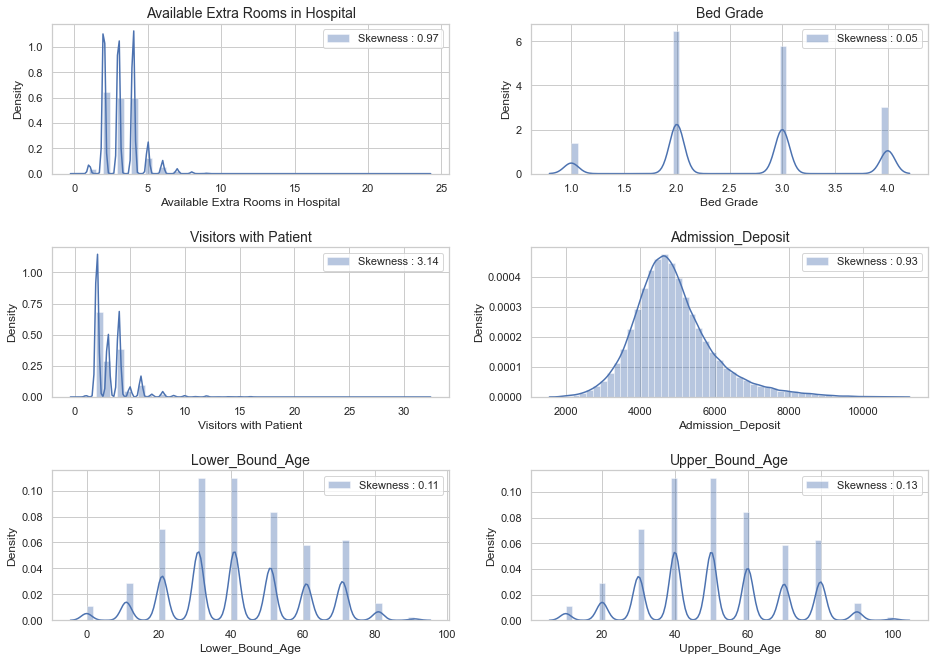

In [36]:
fig, ax =plt.subplots(3,2, figsize=(14,10))
fig.tight_layout(pad=5.0)

for ax, n in zip(ax.flatten(), num_data.columns.tolist()):
    sns.distplot(ax=ax, a=num_data[n].dropna(), label="Skewness : %.2f"%(num_data[n].skew()))
    ax.set_title(n, fontsize = 14)
    ax.legend(loc = 'best')

In the next step, we plot a heatmap to check the correlation between the numerical columns:

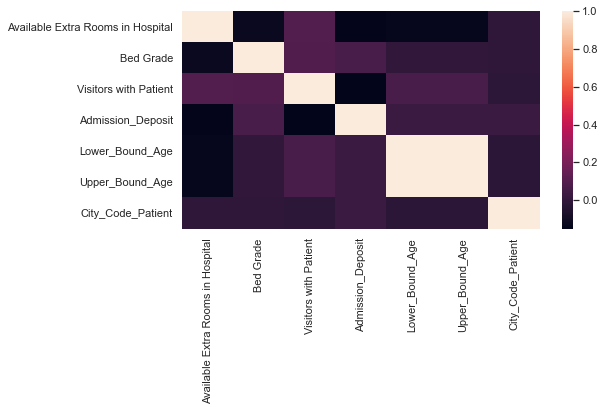

In [37]:
# Heatmap data numeric
heatmapdata = train[['Stay', 'Available Extra Rooms in Hospital', 'Bed Grade', 'Visitors with Patient'
             , 'Admission_Deposit', 'Lower_Bound_Age', 'Upper_Bound_Age', 'City_Code_Patient']]

cormat = heatmapdata.corr()
fig, ax = plt.subplots(figsize = (8,4))
sns.heatmap(data = cormat)
plt.show()

Now, we will observe the categorical columns via barplots to see the count of different classes through different columns:

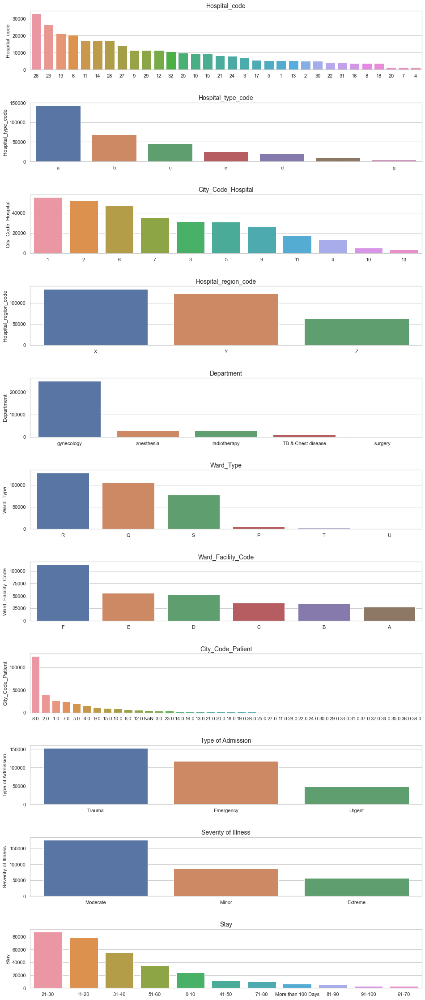

In [38]:
fig, ax = plt.subplots(cat_data.shape[1],1, figsize = (14, 32))
fig.tight_layout(pad = 5.0)

for ax, n in zip(ax.flatten(), cat_data.columns.tolist()):
    x_axis = cat_data[n].fillna('NaN').value_counts().index
    y_axis = cat_data[n].fillna('NaN').value_counts()
    sns.barplot(ax = ax, x = x_axis, y = y_axis, order =  x_axis)
    ax.set_title(n, fontsize = 14)
    
plt.show()

In [39]:
# Manipulate columns position to easly do preprocessing data

# Move columns 'Stay' to first position
train = train[['Stay'] + [col for col in train.columns.tolist() if col != 'Stay']]

In [40]:
print('Total null value on data train (%) :\n', np.round(train.isnull().sum() * 100 / len(train), 4))

Total null value on data train (%) :
 Stay                                 0.0000
case_id                              0.0000
Hospital_code                        0.0000
Hospital_type_code                   0.0000
City_Code_Hospital                   0.0000
Hospital_region_code                 0.0000
Available Extra Rooms in Hospital    0.0000
Department                           0.0000
Ward_Type                            0.0000
Ward_Facility_Code                   0.0000
Bed Grade                            0.0355
patientid                            0.0000
City_Code_Patient                    1.4232
Type of Admission                    0.0000
Severity of Illness                  0.0000
Visitors with Patient                0.0000
Age                                  0.0000
Admission_Deposit                    0.0000
Lower_Bound_Age                      0.0000
Upper_Bound_Age                      0.0000
dtype: float64


As seen in the previous cell, we have some null values in some of the columns. In the next cell we will drop these null values. We prefer to drop them as the number of empty values is quite small relative to the total number of datapoints in our dataset. So we assume that dropping them will not make a big difference in our analysis.

In [41]:
# drop missing value on columns 'Bed Grade' and 'City_Code_Patient'
train.dropna(subset = ['Bed Grade', 'City_Code_Patient'], inplace = True)

In [42]:
print('Total null value on data train (%) :\n', np.round(train.isnull().sum() * 100 / len(train), 4))

Total null value on data train (%) :
 Stay                                 0.0
case_id                              0.0
Hospital_code                        0.0
Hospital_type_code                   0.0
City_Code_Hospital                   0.0
Hospital_region_code                 0.0
Available Extra Rooms in Hospital    0.0
Department                           0.0
Ward_Type                            0.0
Ward_Facility_Code                   0.0
Bed Grade                            0.0
patientid                            0.0
City_Code_Patient                    0.0
Type of Admission                    0.0
Severity of Illness                  0.0
Visitors with Patient                0.0
Age                                  0.0
Admission_Deposit                    0.0
Lower_Bound_Age                      0.0
Upper_Bound_Age                      0.0
dtype: float64


Finally, we check the outliers in the categorical columns. So we observe the boxplots for the relevant features as seen below:

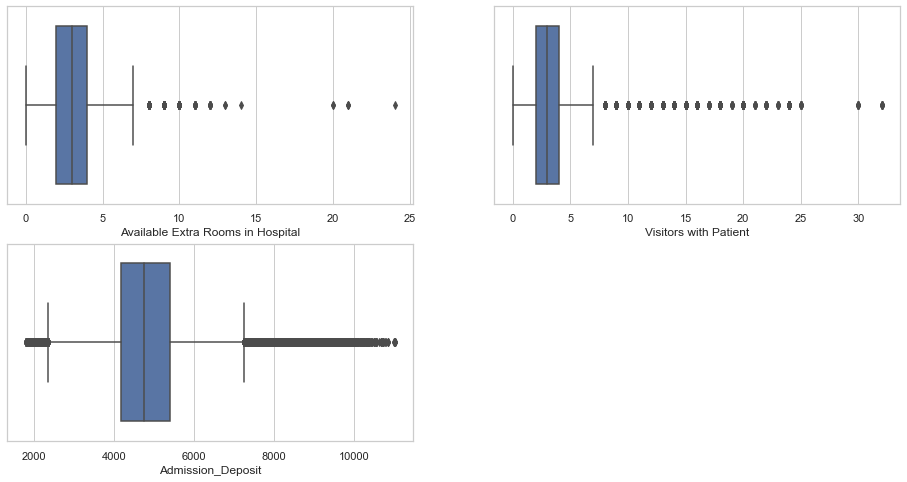

In [43]:
fig, ax = plt.subplots(2,2, figsize = (16,8))
sns.boxplot(ax = ax[0, 0], x = train['Available Extra Rooms in Hospital'])
sns.boxplot(ax = ax[0, 1], x = train['Visitors with Patient'])
sns.boxplot(ax = ax[1, 0], x = train['Admission_Deposit'])
fig.delaxes(ax[1,1])

plt.show()

In the boxplots above, it is observed that there are considerable amount of outliers in the relevant columns. We will now remove those outliers to be able to obtain clean and accurate prediction results in the upcoming stages of our analysis. To do this we use the IQR method which could also be found in the following link: https://towardsdatascience.com/ways-to-detect-and-remove-the-outliers-404d16608dba

In [44]:
# Remove outliers from data train
# https://towardsdatascience.com/ways-to-detect-and-remove-the-outliers-404d16608dba

q1 = train['Available Extra Rooms in Hospital'].quantile(0.25)
q3 = train['Available Extra Rooms in Hospital'].quantile(0.75)
iqr = q3-q1
train = train[~((train['Available Extra Rooms in Hospital'] < (q1 - 1.5 * iqr)) | (train['Available Extra Rooms in Hospital'] > (q3+1.5*iqr)))]

q1=train['Visitors with Patient'].quantile(0.25)
q3 = train['Visitors with Patient'].quantile(0.75)
iqr = q3-q1
train = train[~ ((train['Visitors with Patient'] < q1 - 1.5 * iqr) | (train['Visitors with Patient'] > (q3 + 1.5 * iqr)))]

q1=train['Admission_Deposit'].quantile(0.25)
q3 = train['Admission_Deposit'].quantile(0.75)
iqr = q3-q1
train = train[~ ((train['Admission_Deposit'] < q1 - 1.5 * iqr) | (train['Admission_Deposit'] > (q3 + 1.5 * iqr)))]

Next, we apply log transformation to the data

In [45]:
# Do log transform on data train
train['Available Extra Rooms in Hospital'] = np.log(train['Available Extra Rooms in Hospital'] + 1)
train['Visitors with Patient'] = np.log(train['Visitors with Patient'] + 1)
# Remove outliers after log transform on data train
train = train[train['Available Extra Rooms in Hospital'] > 0]
train = train[train['Visitors with Patient'] > 0]

We plot the boxplots again to confirm the outliers have been removed:

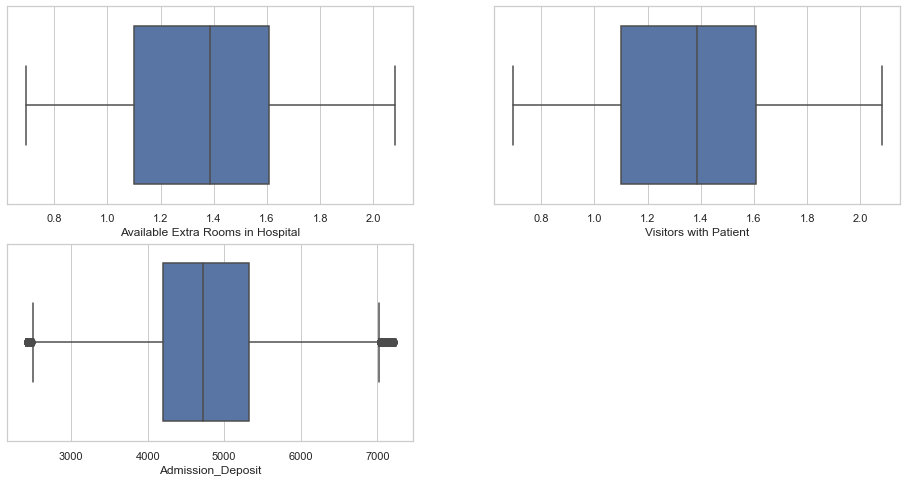

In [46]:
fig, ax = plt.subplots(2,2, figsize = (16,8))
sns.boxplot(ax = ax[0, 0], x = train['Available Extra Rooms in Hospital'])
sns.boxplot(ax = ax[0, 1], x = train['Visitors with Patient'])
sns.boxplot(ax = ax[1, 0], x = train['Admission_Deposit'])
fig.delaxes(ax[1,1])
plt.show()

After the log transformation we check the distribution of the numerical columns once again to check they now confirm with normality:

C:\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



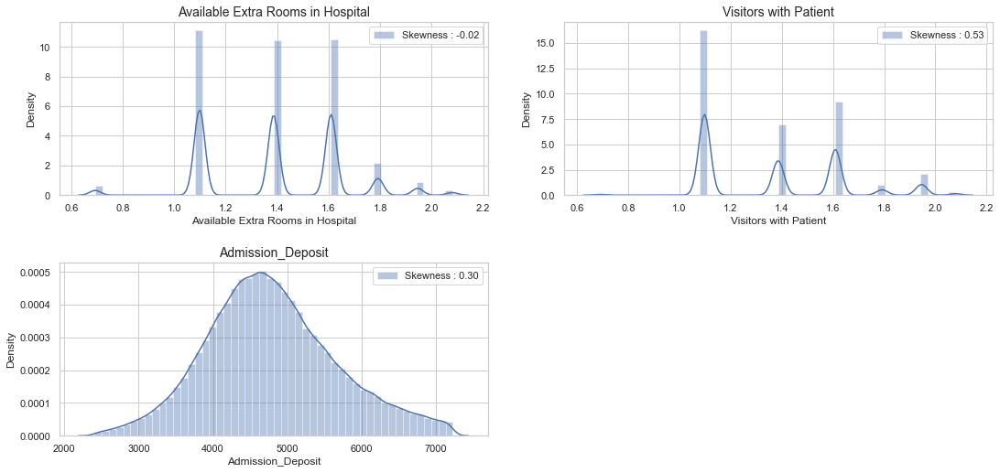

In [47]:
fig, ax =plt.subplots(2,2, figsize=(16,8))
fig.tight_layout(pad=5.0)

sns.distplot(ax=ax[0, 0], a=train['Available Extra Rooms in Hospital']
             , label="Skewness : %.2f"%(train['Available Extra Rooms in Hospital'].skew()))
ax[0, 0].set_title('Available Extra Rooms in Hospital', fontsize = 14)
ax[0, 0].legend(loc = 'best')

sns.distplot(ax=ax[0, 1], a=train['Visitors with Patient']
             , label="Skewness : %.2f"%(train['Visitors with Patient'].skew()))
ax[0, 1].set_title('Visitors with Patient', fontsize = 14)
ax[0, 1].legend(loc = 'best')

sns.distplot(ax=ax[1, 0], a=train['Admission_Deposit']
             , label="Skewness : %.2f"%(train['Admission_Deposit'].skew()))
ax[1, 0].set_title('Admission_Deposit', fontsize = 14)
ax[1, 0].legend(loc = 'best')

fig.delaxes(ax[1,1])

plt.show()

Below, we will do manual encoding for the columns that are not having more than 10 classes. This is because we want to avoid curse of dimensionality:

In [48]:
admission_encode = {'Trauma' : 1, 'Urgent' : 2, 'Emergency' : 3}
train['Type of Admission'] = train['Type of Admission'].map(admission_encode)


severity_encode = {'Minor' : 1, 'Moderate' : 2, 'Extreme' : 3}
train['Severity of Illness'] = train['Severity of Illness'].map(severity_encode)

stay_encode = {'0-10' : 0, '11-20' : 1, '21-30' : 2, '31-40' : 3, '41-50' : 4, '51-60' : 5, '61-70' : 6
            ,'71-80' : 7, '81-90' : 8, '91-100' : 9, 'More than 100 Days' : 10}
train['Stay'] = train['Stay'].map(stay_encode)

For the remaining categorical columns, we apply one hot encoding

In [49]:
from sklearn.preprocessing import OneHotEncoder
# By dropping one of the one-hot encoded columns from each categorical feature, we ensure there are no "reference" columns—the remaining columns become linearly independent.
# https://kiwidamien.github.io/are-you-getting-burned-by-one-hot-encoding.html
# https://www.youtube.com/watch?v=g9aLvY8BfRM
nominal_data = ['Hospital_type_code', 'Hospital_region_code', 'Department', 'Ward_Type', 'Ward_Facility_Code']
testja = pd.DataFrame()
for n in nominal_data:
    ohe = OneHotEncoder(sparse = False, drop = 'first', categories = 'auto')
    ohe.fit(train[nominal_data])
    ohecategory_train = ohe.transform(train[nominal_data])

    for i in range(ohecategory_train.shape[1]):
        train['dummy_variable_' + n + '_' + str(i)] = ohecategory_train[:,i]
        


print('Train shape :', train.shape)

Train shape : (291276, 130)


Next, we do standard scaling to fit all the values into a standard format so its easier to do the analysis

In [50]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
num_col = ['Available Extra Rooms in Hospital', 'Bed Grade', 'Visitors with Patient'
             , 'Admission_Deposit', 'Lower_Bound_Age', 'Upper_Bound_Age']
sc.fit(train[num_col])
train[num_col] = sc.transform(train[num_col])

In [51]:
train[num_col].head()

,Available Extra Rooms in Hospital,Bed Grade,Visitors with Patient,Admission_Deposit,Lower_Bound_Age,Upper_Bound_Age
0,-0.033385,-0.692066,-0.937792,0.138237,0.466474,0.466504
1,-1.120711,-0.692066,-0.937792,1.322949,0.466474,0.466504
2,-1.120711,-0.692066,-0.937792,-0.050318,0.466474,0.466504
4,-1.120711,-0.692066,-0.937792,0.873145,0.466474,0.466504
5,-1.120711,-0.692066,-0.937792,-0.386535,0.466474,0.466504


In [52]:
# See if train and test data have same shape and column position
print('Train columns :\n',train.columns)
print('Train shape : ', train.shape)

Train columns :
 Index(['Stay', 'case_id', 'Hospital_code', 'Hospital_type_code',
       'City_Code_Hospital', 'Hospital_region_code',
       'Available Extra Rooms in Hospital', 'Department', 'Ward_Type',
       'Ward_Facility_Code',
       ...
       'dummy_variable_Ward_Facility_Code_12',
       'dummy_variable_Ward_Facility_Code_13',
       'dummy_variable_Ward_Facility_Code_14',
       'dummy_variable_Ward_Facility_Code_15',
       'dummy_variable_Ward_Facility_Code_16',
       'dummy_variable_Ward_Facility_Code_17',
       'dummy_variable_Ward_Facility_Code_18',
       'dummy_variable_Ward_Facility_Code_19',
       'dummy_variable_Ward_Facility_Code_20',
       'dummy_variable_Ward_Facility_Code_21'],
      dtype='object', length=130)
Train shape :  (291276, 130)


In [53]:
train.head()

,Stay,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,...,dummy_variable_Ward_Facility_Code_12,dummy_variable_Ward_Facility_Code_13,dummy_variable_Ward_Facility_Code_14,dummy_variable_Ward_Facility_Code_15,dummy_variable_Ward_Facility_Code_16,dummy_variable_Ward_Facility_Code_17,dummy_variable_Ward_Facility_Code_18,dummy_variable_Ward_Facility_Code_19,dummy_variable_Ward_Facility_Code_20,dummy_variable_Ward_Facility_Code_21
0,0,1,8,c,3,Z,-0.033385,radiotherapy,R,F,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,4,2,2,c,5,Z,-1.120711,radiotherapy,S,F,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,3,3,10,e,1,X,-1.120711,anesthesia,S,E,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,4,5,26,b,2,Y,-1.120711,radiotherapy,S,D,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
5,1,6,23,a,6,X,-1.120711,anesthesia,S,F,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


We dropo the unnecessary columns:

In [54]:
train.drop(['case_id', 'Hospital_code', 'patientid', 'Age', 'City_Code_Hospital', 'City_Code_Patient'
            , 'Hospital_type_code', 'Hospital_region_code', 'Department', 'Ward_Type', 'Ward_Facility_Code']
           , axis = 1, inplace = True)

In [55]:
# See if train and test data have same shape and column position
print('Train columns :\n',train.columns)
print('Train shape : ', train.shape)

Train columns :
 Index(['Stay', 'Available Extra Rooms in Hospital', 'Bed Grade',
       'Type of Admission', 'Severity of Illness', 'Visitors with Patient',
       'Admission_Deposit', 'Lower_Bound_Age', 'Upper_Bound_Age',
       'dummy_variable_Hospital_type_code_0',
       ...
       'dummy_variable_Ward_Facility_Code_12',
       'dummy_variable_Ward_Facility_Code_13',
       'dummy_variable_Ward_Facility_Code_14',
       'dummy_variable_Ward_Facility_Code_15',
       'dummy_variable_Ward_Facility_Code_16',
       'dummy_variable_Ward_Facility_Code_17',
       'dummy_variable_Ward_Facility_Code_18',
       'dummy_variable_Ward_Facility_Code_19',
       'dummy_variable_Ward_Facility_Code_20',
       'dummy_variable_Ward_Facility_Code_21'],
      dtype='object', length=119)
Train shape :  (291276, 119)


In [56]:
train.shape

(291276, 119)

In [57]:
train1 = train.copy()

In [58]:
# train = train1.copy()

In [59]:
train = train.sample(7000)

We split the variables and the column that we want to predict:

In [60]:
X = train.iloc[:, 1:].values
y = train.iloc[:, 0].values

In [61]:
X = X.astype(np.float32)
y = y.astype(np.int64)

We split the training, validation and testing set by stratified folds:

In [62]:
# Split train into train-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

We create this to check the class distributions within the training and test set:

In [63]:
def get_class_distribution(obj):
    count_dict = {
        "rating_0": 0,
        "rating_1": 0,
        "rating_2": 0,
        "rating_3": 0,
        "rating_4": 0,
        "rating_5": 0,
        "rating_6": 0,
        "rating_7": 0,
        "rating_8": 0,
        "rating_9": 0,
        "rating_10": 0
    }
    
    for i in obj:
        if i == 0: 
            count_dict['rating_0'] += 1
        elif i == 1: 
            count_dict['rating_1'] += 1
        elif i == 2: 
            count_dict['rating_2'] += 1
        elif i == 3: 
            count_dict['rating_3'] += 1
        elif i == 4: 
            count_dict['rating_4'] += 1  
        elif i == 5: 
            count_dict['rating_5'] += 1
        elif i == 6: 
            count_dict['rating_6'] += 1
        elif i == 7: 
            count_dict['rating_7'] += 1
        elif i == 8: 
            count_dict['rating_8'] += 1
        elif i == 9: 
            count_dict['rating_9'] += 1
        elif i == 10: 
            count_dict['rating_10'] += 1
        else:
            print("Check classes.")
            
    return count_dict

In [64]:
y_train.shape

(5600,)

In [65]:
y_train.mean()

2.5807142857142855

In [66]:
y_test.shape

(1400,)

In [67]:
y_test.mean()

2.577857142857143

In [68]:
X_train.shape

(5600, 118)

In [69]:
X_test.shape

(1400, 118)

In [70]:
collections.Counter(y_train)

Counter({2: 1594,
         8: 69,
         5: 599,
         1: 1372,
         3: 1002,
         7: 167,
         0: 423,
         10: 58,
         4: 225,
         6: 43,
         9: 48})

In [71]:
get_class_distribution(y_train)

{'rating_0': 423,
 'rating_1': 1372,
 'rating_2': 1594,
 'rating_3': 1002,
 'rating_4': 225,
 'rating_5': 599,
 'rating_6': 43,
 'rating_7': 167,
 'rating_8': 69,
 'rating_9': 48,
 'rating_10': 58}

Text(0.5, 1.0, 'Class Distribution in Test Set')

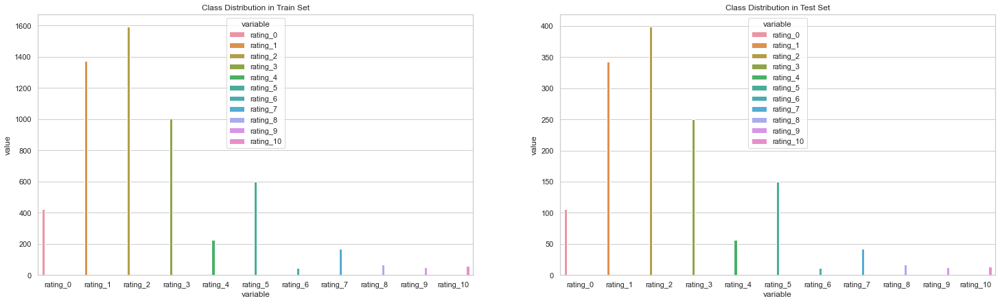

In [72]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25,7))
# Train
sns.barplot(data = pd.DataFrame.from_dict([get_class_distribution(y_train)]).melt(), x = "variable", y="value", hue="variable",  ax=axes[0]).set_title('Class Distribution in Train Set')
# Test
sns.barplot(data = pd.DataFrame.from_dict([get_class_distribution(y_test)]).melt(), x = "variable", y="value", hue="variable",  ax=axes[1]).set_title('Class Distribution in Test Set')

We define a vanilla neural network with one hidden layer. The output layer should have 11 output units since there are 11 classes. In addition, it should have a softmax nonlinearity, because later, when calling predict_proba, the output from the forward call will be used.

In [73]:
class ClassifierModule(nn.Module):
    def __init__(
            self,
            num_units=118,
            nonlin=F.relu,
            dropout=0.5,
    ):
        super(ClassifierModule, self).__init__()
        self.num_units = num_units
        self.nonlin = nonlin
        self.dropout = dropout

        self.dense0 = nn.Linear(118, num_units)
        self.nonlin = nonlin
        self.dropout = nn.Dropout(dropout)
        self.dense1 = nn.Linear(num_units, 64)
        self.output = nn.Linear(64, 11)

    def forward(self, X, **kwargs):
        X = self.nonlin(self.dense0(X))
        X = self.dropout(X)
        X = F.relu(self.dense1(X))
        X = F.softmax(self.output(X), dim=-1)
        return X

We insert our neural network class created above into our classifier. We use NeuralNetClassifier for this as we have multiclass classification problem. We identify the initial hyperparameters. Fit the model on the training set, and predict the desired classes on the test set:

In [74]:
net = NeuralNetClassifier(
    ClassifierModule,
    max_epochs=100,
    lr=0.3,
    warm_start = True,
    # Shuffle training data on each epoch
    iterator_train__shuffle=True,
    optimizer__momentum=0.25,
    optimizer__weight_decay=0.01,
)

net.fit(X_train, y_train)
y_proba_without_grid = net.predict_proba(X_test)
y_pred_without_grid = net.predict(X_test)

  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.9046       0.2804        1.7695  0.1396
      2        1.7431       0.3598        1.6708  0.1646
      3        1.6837       0.3607        1.6566  0.1592
      4        1.6739       0.3670        1.6349  0.1668
      5        1.6628       0.3812        1.6174  0.1477
      6        1.6574       0.3741        1.6222  0.1455
      7        1.6493       0.3937        1.6019  0.1422
      8        1.6525       0.3946        1.6004  0.1244
      9        1.6440       0.3768        1.6040  0.1489
     10        1.6470       0.3839        1.5966  0.1452
     11        1.6450       0.3830        1.6020  0.1486
     12        1.6432       0.3232        1.6366  0.1366
     13        1.6382       0.3750        1.5958  0.1426
     14        1.6317       0.3741        1.6024  0.1406
     15        1.6316       0.3723        1.5991  0.1576
     16        1.6302       0.3

We filter the above results which have a validation accuracy higher than 0.3

In [75]:
assert net.history[-1, 'valid_acc'] >= 0.3

We use GridSearchCV to to grid search and crossvalidation on the selected hyperparameters below to find the best parameters. Then we fit the model and predict the desired classes:

In [76]:
'''
begin = time.time()

# deactivate skorch-internal train-valid split and verbose logging
net.set_params(train_split=False, verbose=0)
params = {
    'lr': [0.1, 0.2, 0.3],
    'max_epochs': [10, 20, 30],
    'optimizer__momentum': [0.10, 0.15, 0.20],
    'optimizer__weight_decay': [0.01, 0.02, 0.03],
    
}
gs = GridSearchCV(net, params, refit=False, cv=3, scoring='accuracy', verbose=2)

gs.fit(X_train, y_train)
print("best score: {:.3f}, best params: {}".format(gs.best_score_, gs.best_params_))
y_proba_with_grid = net.predict_proba(X_test)
y_pred_with_grid = net.predict(X_test)

end = time.time()
  
# total time taken
print(f"Total runtime of the program is {end - begin}")

'''

Fitting 3 folds for each of 81 candidates, totalling 243 fits
[CV] END lr=0.1, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.01; total time=   1.1s
[CV] END lr=0.1, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.01; total time=   1.0s
[CV] END lr=0.1, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.01; total time=   0.9s
[CV] END lr=0.1, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.02; total time=   1.0s
[CV] END lr=0.1, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.02; total time=   1.0s
[CV] END lr=0.1, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.02; total time=   1.0s
[CV] END lr=0.1, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.03; total time=   1.1s
[CV] END lr=0.1, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.03; total time=   1.1s
[CV] END lr=0.1, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.03; tot

[CV] END lr=0.1, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.02; total time=   3.0s
[CV] END lr=0.1, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.03; total time=   3.0s
[CV] END lr=0.1, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.03; total time=   3.0s
[CV] END lr=0.1, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.03; total time=   3.9s
[CV] END lr=0.2, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.01; total time=   1.2s
[CV] END lr=0.2, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.01; total time=   1.1s
[CV] END lr=0.2, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.01; total time=   1.1s
[CV] END lr=0.2, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.02; total time=   1.1s
[CV] END lr=0.2, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.02; total time=   1.0s
[CV] END lr=0.2, max_epochs=10, optimizer__mom

[CV] END lr=0.2, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.01; total time=   3.2s
[CV] END lr=0.2, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.02; total time=   3.2s
[CV] END lr=0.2, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.02; total time=   3.0s
[CV] END lr=0.2, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.02; total time=   2.8s
[CV] END lr=0.2, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.03; total time=   3.1s
[CV] END lr=0.2, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.03; total time=   3.2s
[CV] END lr=0.2, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.03; total time=   3.0s
[CV] END lr=0.3, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.01; total time=   1.0s
[CV] END lr=0.3, max_epochs=10, optimizer__momentum=0.1, optimizer__weight_decay=0.01; total time=   1.0s
[CV] END lr=0.3, max_epochs=10, optimizer__mom

[CV] END lr=0.3, max_epochs=30, optimizer__momentum=0.15, optimizer__weight_decay=0.03; total time=   3.3s
[CV] END lr=0.3, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.01; total time=   3.0s
[CV] END lr=0.3, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.01; total time=   3.0s
[CV] END lr=0.3, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.01; total time=   3.1s
[CV] END lr=0.3, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.02; total time=   2.8s
[CV] END lr=0.3, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.02; total time=   2.9s
[CV] END lr=0.3, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.02; total time=   2.9s
[CV] END lr=0.3, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.03; total time=   2.9s
[CV] END lr=0.3, max_epochs=30, optimizer__momentum=0.2, optimizer__weight_decay=0.03; total time=   2.8s
[CV] END lr=0.3, max_epochs=30, optimizer__mo

Having found the best parameters above, we retrain our model on the best hyperparameters, fit the model and get the predicted outcomes:

In [77]:
import time
begin = time.time()

best_params = {
    'lr': [0.1],
    'max_epochs': [30],
    'optimizer__momentum': [0.10],
    'optimizer__weight_decay': [0.01],
}

gs = GridSearchCV(net, best_params, cv=3, scoring='accuracy', verbose=2)

gs.fit(X_train, y_train)
print("best score for train: {:.3f}".format(gs.best_score_))
y_pred_best_grid = net.predict(X_test)

end = time.time()
# total time taken
print(f"Total runtime of the program is {end - begin}")

Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV] END lr=0.1, max_epochs=30, optimizer__momentum=0.1, optimizer__weight_decay=0.01; total time=   3.0s
[CV] END lr=0.1, max_epochs=30, optimizer__momentum=0.1, optimizer__weight_decay=0.01; total time=   3.2s
[CV] END lr=0.1, max_epochs=30, optimizer__momentum=0.1, optimizer__weight_decay=0.01; total time=   3.6s
best score for train: 0.381
Total runtime of the program is 15.295992851257324


In [78]:
from sklearn.metrics import r2_score

In [79]:
pred=y_pred_best_grid


We measure the accuracy of the model on the test set:

In [80]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, pred)

0.36357142857142855

We measure the loss with cross-entropy function

In [81]:
from sklearn.metrics import log_loss
eval = log_loss(y_test,y_proba_with_grid)

In [82]:
eval

1.6086850946290152

On the selected model, we plot the confusion matrix and the classification report:

In [83]:
# Making the Confusion Matrix
#print(pd.crosstab(Y_test_label, Y_pred_label, rownames=['Actual Activity'], colnames=['Predicted Activity']))
print(confusion_matrix(y_test,pred))
print("\n")
print(classification_report(y_test,pred))

final_model = gs.best_estimator_

#print("Training set score for MLP: %f" % final_model.score(X_train , y_train))
#print("Testing  set score for MLP: %f" % final_model.score(X_test  , y_test )

#final_model.score()

[[  0  79  25   1   0   1   0   0   0   0   0]
 [  0 213 110   9   0  11   0   0   0   0   0]
 [  0 203 182   4   0  10   0   0   0   0   0]
 [  0  65  90  39   0  56   0   0   0   0   0]
 [  0  18  29   5   0   4   0   0   0   0   0]
 [  0  19   9  47   0  75   0   0   0   0   0]
 [  0   3   4   0   0   4   0   0   0   0   0]
 [  0   5   5  12   0  20   0   0   0   0   0]
 [  0   0   0   3   0  14   0   0   0   0   0]
 [  0   2   2   3   0   5   0   0   0   0   0]
 [  0   5   1   1   0   7   0   0   0   0   0]]


              precision    recall  f1-score   support

           0       0.00      0.00      0.00       106
           1       0.35      0.62      0.45       343
           2       0.40      0.46      0.43       399
           3       0.31      0.16      0.21       250
           4       0.00      0.00      0.00        56
           5       0.36      0.50      0.42       150
           6       0.00      0.00      0.00        11
           7       0.00      0.00      0.00    

C:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



**SVC Implementation**

In [84]:
array_sum = np.sum(X_train)
array_has_nan = np.isnan(array_sum)
print(array_has_nan)

False


We identify the hyperparamters we want to do grid seacrh on:

In [85]:
'''
# Create the parameter grid based on the results of random search 
params_grid = [{'kernel': ['rbf'], 'gamma': [1e-3, 1e-4],
                     'C': [1, 10, 100, 1000]},
                    {'kernel': ['linear'], 'C': [1, 10, 100, 1000]},
              {'kernel': ['polynomial'], 'gamma': [1e-3, 1e-4], 'C': [1, 10, 100, 1000], 'degree': [1, 2, 3, 4]},
              {'kernel': ['sigmoid'], 'C': [1, 10, 100, 1000], 'gamma': [1e-3, 1e-4], 'degree': [1, 2, 3, 4]}]
            
'''

"\n#Libraries to Build Ensemble Model : Random Forest Classifier \n# Create the parameter grid based on the results of random search \nparams_grid = [{'kernel': ['rbf'], 'gamma': [1e-3, 1e-4],\n                     'C': [1, 10, 100, 1000]},\n                    {'kernel': ['linear'], 'C': [1, 10, 100, 1000]},\n              {'kernel': ['polynomial'], 'gamma': [1e-3, 1e-4], 'C': [1, 10, 100, 1000], 'degree': [1, 2, 3, 4]},\n              {'kernel': ['sigmoid'], 'C': [1, 10, 100, 1000], 'gamma': [1e-3, 1e-4], 'degree': [1, 2, 3, 4]}]\n            \n"

In [86]:
params_grid = [{'kernel': ['rbf'], 'gamma': [1e-3],
                     'C': [100]}]

We do grid search cross validation on the SVC classifier and fit the model:

In [87]:
import time
begin = time.time()

# Performing CV to tune parameters for best SVM fit 
svm_model = GridSearchCV(SVC(), params_grid, cv=3)
svm_model.fit(X_train, y_train)

end = time.time()
  
# total time taken
print(f"Total runtime of the program is {end - begin}")

Total runtime of the program is 14.843119859695435


We identify the best hyperparameters, fit the final model on the best hyperparameters and predicted the desired classes on the test set:

In [88]:
# View the accuracy score
print('Best score for training data:', svm_model.best_score_,"\n") 

# View the best parameters for the model found using grid search
print('Best C:',svm_model.best_estimator_.C,"\n") 
print('Best Kernel:',svm_model.best_estimator_.kernel,"\n")
print('Best Gamma:',svm_model.best_estimator_.gamma,"\n")

final_model = svm_model.best_estimator_
Y_pred = final_model.predict(X_test)
# Y_pred_label = list(encoder.inverse_transform(y_pred))

Best score for training data: 0.3878560194330632 

Best C: 100 

Best Kernel: rbf 

Best Gamma: 0.001 



Finally, we measure the accuracy of the model on the unseen data:

In [89]:
accuracy_score(y_test, Y_pred)

0.3921428571428571

We measure the model's performance by using the confusion matrix and the classification report:

In [90]:
# Making the Confusion Matrix
#print(pd.crosstab(Y_test_label, Y_pred_label, rownames=['Actual Activity'], colnames=['Predicted Activity']))
print(confusion_matrix(y_test,Y_pred))
print("\n")
print(classification_report(y_test,Y_pred))

#print("Training set score for SVM: %f" % final_model.score(X_train , y_train))
#print("Testing  set score for SVM: %f" % final_model.score(X_test  , y_test ))

svm_model.score

[[  1  58  44   2   0   1   0   0   0   0   0]
 [  0 168 155  10   0  10   0   0   0   0   0]
 [  1 134 250   8   0   6   0   0   0   0   0]
 [  1  48  99  55   0  47   0   0   0   0   0]
 [  0  14  33   5   0   4   0   0   0   0   0]
 [  1  14  17  43   0  75   0   0   0   0   0]
 [  0   2   5   0   0   4   0   0   0   0   0]
 [  0   3   7  13   0  19   0   0   0   0   0]
 [  0   0   0   4   0  13   0   0   0   0   0]
 [  0   1   3   5   0   3   0   0   0   0   0]
 [  0   4   2   1   0   7   0   0   0   0   0]]


              precision    recall  f1-score   support

           0       0.25      0.01      0.02       106
           1       0.38      0.49      0.43       343
           2       0.41      0.63      0.49       399
           3       0.38      0.22      0.28       250
           4       0.00      0.00      0.00        56
           5       0.40      0.50      0.44       150
           6       0.00      0.00      0.00        11
           7       0.00      0.00      0.00    

C:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



<bound method BaseSearchCV.score of GridSearchCV(cv=3, estimator=SVC(),
             param_grid=[{'C': [100], 'gamma': [0.001], 'kernel': ['rbf']}])>

We measure the loss of our model:

In [91]:
r2_score(Y_pred,y_test)

-0.8548617146193089